## DS4DS Final Task:
### **Deadline: 18th of March, 18:00**
Upload your solution (training pipeline and final model ready for inference) as one archive file (.zip, .rar,...) to [PANDA](https://panda.uni-paderborn.de/mod/assign/view.php?id=2569652).

In [1]:
using Pkg
Pkg.activate(".")
Pkg.status()

  Activating project at `/scratch/hpc-prf-ds4ds/group6/tset_zw`


Status `/scratch/hpc-prf-ds4ds/group6/tset_zw/Project.toml`
  [b0b7db55] ComponentArrays v0.15.8
  [82cc6244] DataInterpolations v4.6.0
  [587475ba] Flux v0.14.11
  [b964fa9f] LaTeXStrings v1.3.1
  [d3d80556] LineSearches v7.2.0
  [b2108857] Lux v0.5.14
  [23992714] MAT v0.10.6
  [7f7a1694] Optimization v3.22.0
  [253f991c] OptimizationFlux v0.2.1
  [36348300] OptimizationOptimJL v0.2.2
  [42dfb2eb] OptimizationOptimisers v0.2.1
  [1dea7af3] OrdinaryDiffEq v6.70.1
  [d96e819e] Parameters v0.12.3
  [91a5bcdd] Plots v1.40.1
  [1ed8b502] SciMLSensitivity v7.55.0
  [2913bbd2] StatsBase v0.34.2
  [e88e6eb3] Zygote v0.6.69
  [9e88b42a] Serialization


In [ ]:
# this might take a few minutes, but you should only need to do this once
# when you use the project for the first time
Pkg.precompile()

In [ ]:
Pkg.add("MAT")
Pkg.add("Plots")
Pkg.add("LaTeXStrings")
Pkg.add("Serialization") # Note: Serialization is a standard library, so it doesn't need to be added.
Pkg.add("StatsBase")
Pkg.add("Lux")
Pkg.add("Flux")
Pkg.add("DataInterpolations")
Pkg.add("ComponentArrays")
Pkg.add("OrdinaryDiffEq")
Pkg.add("SciMLSensitivity")
Pkg.add("Optimization")
Pkg.add("OptimizationOptimJL")
Pkg.add("LineSearches")
Pkg.add("Zygote")
Pkg.add("Parameters")

   Resolving package versions...


In [2]:
using OrdinaryDiffEq, Lux, Random, ComponentArrays, Plots, LaTeXStrings
using SciMLSensitivity, Optimization, OptimizationOptimJL, LineSearches, Zygote, OptimizationFlux, LinearAlgebra
using MAT
using StatsBase
using Serialization
using DataInterpolations
using Random
using Statistics
using OptimizationOptimisers
using Parameters: @unpack
using Serialization


include("utils.jl");


### Thermal modelling of an electric vehicle motor

Your task is to create a model for the thermal dynamics of an electric motor.
More formally, you need to find a parameterized model of the form

$$
\begin{align}
    \frac{\mathrm{d}}{\mathrm{d}t} \mathbf{x}(t) &= \mathcal{M}_\mathbf{w} (\mathbf{x}(t), \mathbf{u}(t)) \\
    \mathbf{y}(t) & = \mathbf{x} (t)
\end{align}
$$

where $\mathbf{x}(t)$ the state of the system and $\mathbf{u(t)}$ is the input vector. The state and
input signals are described further into this notebook. There are no boundaries on the specific model class and topology regarding $\mathcal{M}_\mathbf{w}$, that is, you are allowed to investigate freely which modelling approaches are suitable.

You will be given a dataset which you can use to train/fit your model. After submission, we will evaluate your model
on a different portion of the dataset to see its generalization performance.
This evaluation will be done by comparing state trajectories predicted by your model $\hat{\mathbf{X}}_i$ with the
true trajectory $\mathbf{X}_i$ using the mean squared error (MSE). The estimate $\hat{\mathbf{X}}_i$ is to be calculated 
based on an initial true state $\mathbf{x}_{0,i}$ (which is the first element of $\mathbf{X}_i$) and the true inputs 
$\mathbf{U}_i$ (or an interpolation of the true inputs). This means that your task is to build a simulation model that produces the state trajectory based on the
initial state and inputs.

**Considered grading criteria:**

- functional and tidy codebase
- successful inference on test set (no errors)
- model and feature innovations/concepts (beyond bare-bone NODE)
- final presentation of proposed solution and used modelling rationale (during townhall meeting)
- model accuracy (MSE) on unseen test data

### Load data:

In [3]:
data = matread("train_data.mat")

Dict{String, Any} with 6 entries:
  "XNames"             => Any["TpStatTc" "TpRotTc"]
  "U"                  => [500.01 0.38556 … 59.46 61.18; 500.02 0.392385 … 59.4…
  "X"                  => [65.402 67.427; 65.3795 67.4218; … ; 81.6888 86.2227;…
  "measurement_series" => [1; 1; … ; 10; 10;;]
  "dt"                 => 0.5
  "UNames"             => Any["NSft" "TqSftClcdInv" … "TpOilRotRetA" "TpOilRotR…

In [4]:
# extract data from dict

# U = data["U"][:, 1:10];
U = data["U"];
X = data["X"];
Y = X;

UNames = data["UNames"];
XNames = data["XNames"];
YNames = XNames;

measurement_series = data["measurement_series"];
dt = data["dt"];

U = Float64.(U) # convert to Float32 for performance
X = Float64.(X) # convert to Float32 for performance
Y = Float64.(Y) # convert to Float32 for performance

has_NaN_U = any(isnan.(U))
has_NaN_X = any(isnan.(X))
has_NaN_Y = any(isnan.(Y))


println("U contains NaN: ", has_NaN_U)
println("X contains NaN: ", has_NaN_X)
println("Y contains NaN: ", has_NaN_Y)




function get_tspan_tsteps(y, dt)
  NF = Float64
  datasize = size(y,1)
  total_duration = datasize * dt
  tspan = (zero(NF),NF(total_duration))
  tsteps = range(tspan[1], tspan[2]; length=datasize)
  tsteps_vector = collect(tsteps)
  return tspan, tsteps_vector
end


function normalize_each_feature(features::AbstractMatrix)
  # create a copy of the original data
  normalized_features = copy(features)
  n_features = size(normalized_features, 2)
  min_values = zeros(n_features)
  max_values = zeros(n_features)

  # iterate over each feature
  for i in 1:n_features
      # extract current feature
      feature = normalized_features[:, i]
      
      # calculate and save the minimum and maximum values of the current feature
      min_val = minimum(feature)
      max_val = maximum(feature)
      min_values[i] = min_val
      max_values[i] = max_val
      
      # perform normalization: (feature - min) / (max - min)
      if max_val != min_val
          normalized_features[:, i] = (feature .- min_val) ./ (max_val - min_val)
      else
          # if all values are the same, assign 0 directly
          normalized_features[:, i] .= 0.0
      end
  end
  
  return normalized_features, min_values, max_values
end

function normalize_targets(targets::AbstractMatrix)
  # create a copy of the original data
  normalized_targets = copy(targets)
  n_targets = size(normalized_targets, 2)
  min_values = zeros(n_targets)
  max_values = zeros(n_targets)

  # iterate over each target
  for i in 1:n_targets
      # extract current target
      target = normalized_targets[:, i]
      
      # calculate and save the minimum and maximum values of the current target
      min_val = minimum(target)
      max_val = maximum(target)
      min_values[i] = min_val
      max_values[i] = max_val
      
      # perform normalization: (target - min) / (max - min)
      if max_val != min_val
          normalized_targets[:, i] = (target .- min_val) ./ (max_val - min_val)
      else
          #  if all values are the same, assign 0 directly
          normalized_targets[:, i] .= 0.0
      end
  end
  
  return normalized_targets, min_values, max_values
end



U contains NaN: false
X contains NaN: false
Y contains NaN: false


normalize_targets (generic function with 1 method)

In [5]:
# keep/remove features from the origin data

columns_to_keep = unique([16, 17, 18, 19, 20, 21])
columns_to_keep = sort(columns_to_keep, rev=true)

function keep_features(data, features_to_keep)
  # ensure features_to_keep is sorted and unique to avoid errors or duplications
  features_to_keep = sort(unique(features_to_keep))
  
  # create a new data array by selecting only the columns in features_to_keep
  new_data = data[:, features_to_keep]
  
  return new_data
end


function remove_feature(data)
  columns_to_remove = unique([2, 3, 7, 11, 12, 13, 14, 15])
  columns_to_remove = sort(columns_to_remove, rev=true)
  new_data = data
  for col in columns_to_remove
    new_data = hcat(new_data[:, 1:col-1], new_data[:, col+1:end])
  end
  return new_data
end


remove_feature (generic function with 1 method)

In [6]:
# generate series

function split_measurement_series(measurement_series, U, X)
  # initialize a dictionary to hold the divided data by series
  divided_data = Dict()

  # extract unique series identifiers
  # series_ids = unique(data["measurement_series"])
  # measurement_series_vector = vec(data["measurement_series"])
  series_ids = unique(measurement_series)
  measurement_series_vector = vec(measurement_series)


  # loop over each series id to filter data belonging to that series
  for series_id in series_ids
    # find indices of the current series
    indices = findall(x -> x == series_id, measurement_series_vector)
    
    # extract subsets of U and X for the current series, ensuring 2D structure is retained
    U_series = U[indices, :]
    
    # for X, ensure it retains its 2D shape by careful slicing
    X_series = X[indices, :]
    
    # check and adjust X_series shape if necessary (this step might be redundant if X_series is already correctly shaped)
    if ndims(X_series) == 1
        # reshape to ensure it's a 2D array if it was reduced to 1D
        X_series = reshape(X_series, length(indices), 2)
    end
    
    # store the subsets in the divided_data dictionary
    divided_data[series_id] = Dict("U" => U_series, "X" => X_series)
  end
  
  return divided_data
  
end
new_U = U
new_Y = Y


divided_data = split_measurement_series(measurement_series, new_U, new_Y)


Dict{Any, Any} with 10 entries:
  5  => Dict("U"=>[500.02 0.36288 … 65.34 64.89; 499.99 0.429975 … 65.31 64.87;…
  4  => Dict("U"=>[499.96 0.38913 … 32.7 32.88; 500.01 0.3801 … 32.67 32.89; … …
  6  => Dict("U"=>[500.04 0.409185 … 59.64 60.92; 499.97 0.4053 … 59.64 60.92; …
  7  => Dict("U"=>[499.93 0.384825 … 58.76 59.98; 500.13 0.412335 … 58.74 59.96…
  2  => Dict("U"=>[499.97 0.414225 … 94.97 99.2; 499.95 0.358995 … 94.77 98.83;…
  10 => Dict("U"=>[499.92 0.38913 … 55.24 55.08; 500.1 0.39753 … 55.19 55.05; ……
  9  => Dict("U"=>[499.98 0.38745 … 74.67 75.76; 500.01 0.388395 … 74.67 75.76;…
  8  => Dict("U"=>[499.92 0.39753 … 62.93 64.01; 500.1 0.355005 … 62.93 64.01; …
  3  => Dict("U"=>[500.03 0.385035 … 90.17 91.3; 499.92 0.3822 … 90.14 91.27; ……
  1  => Dict("U"=>[500.01 0.38556 … 59.46 61.18; 500.02 0.392385 … 59.48 61.16;…

In [7]:
# in order to cut each sequence into equal lengths
function get_smallest_series_length_excluding_specific_series(divided_data, exclude_series)
    # initialize the smallest length with a very large value
    smallest_length = typemax(Int)
    
    # iterate through each key-value pair in the divided_data dictionary
    for (series_id, data) in divided_data
        # skip the iteration if the series_id is in the exclude_series list
        if series_id in exclude_series
            continue
        end

        # get the current series length (number of rows in "X")
        current_length = size(data["X"], 1)
        
        # update the smallest_length if the current series is smaller
        if current_length < smallest_length
            smallest_length = current_length
        end
    end
    
    return smallest_length
end

# specify the series to exclude
exclude_series = [3, 4, 5, 9]

smallest_series_length_excluding = get_smallest_series_length_excluding_specific_series(divided_data, exclude_series)


54344

In [8]:
# JUST FOR TESTING 
const TRAIN_SPLIT_RATIO = 0.8

function split_data(data)


  # initialize dictionaries to hold the training and testing data
  training_data = Dict()
  testing_data = Dict()

  # iterate over each series in the divided_data
  for (series_id, series_data) in data
      # extract U and X data for the series
      U_series = series_data["U"]
      X_series = series_data["X"]
      
      # determine the split index
      num_samples = size(U_series, 1)
      split_index = floor(Int, num_samples * TRAIN_SPLIT_RATIO)
      
      # split the U and X data into training and testing sets
      U_train = U_series[1:split_index, :]
      X_train = X_series[1:split_index, :]
      U_test = U_series[(split_index + 1):end, :]
      X_test = X_series[(split_index + 1):end, :]
      
      # store the training and testing sets in their respective dictionaries
      training_data[series_id] = Dict("U" => U_train, "X" => X_train)
      testing_data[series_id] = Dict("U" => U_test, "X" => X_test)
  end

  return training_data, testing_data
end





split_data (generic function with 1 method)

In [9]:

# interpolate inputs for all channels separately
function get_data_continous(u, tsteps)
  
  interp_input = [AkimaInterpolation(u[:, i], tsteps) for i in 1:size(u, 2)]  # deal with more than two features
  return interp_input
end

# interpolation with quadratic spline
function redo_get_data_continous(u, tsteps)
  interp_input = [QuadraticSpline(u[:, i], tsteps) for i in 1:size(u, 2)]  # deal with more than two features
  return interp_input
end

# get data from interpolation with quadratic spline 
function interpolate_input2(t)
    t_float64 = Float64(t)

    return [Float64(DataInterpolations.derivative(f,t_float64)) for f in interp_input_with_last_two]
end


# get data from continued data
function interpolate_input(t, data)
    t_float64 = Float64(t)

    return [Float64(f(t_float64)) for f in data]
end




interpolate_input (generic function with 1 method)

### Data description:

You are given a part of a dataset measured from an electric motor at Mercedes-Benz to examine its thermal properties. The dataset you are given consists of $594885$ measurement points, which are divided into $10$ independent series of measurement sessions. A short description of the different variables in the data is given in the following:

---

- ```data["U"]``` contains a matrix with the shape $594885 \times 21$. These are the $594885$ samples of the input vector $\mathbf{u}(t) \in \mathbb{R}^{21}$ which can influence its thermal behavior. In detail these are
    - $u_1$: rpm, rotations per minute of the motor shaft
    - $u_2$: torque of the drive shaft
    - $u_3$: absolute value of the torque of the drive shaft
    - $u_4$: $i_d$ d-current
    - $u_5$: $i_q$ q-current
    - $u_6$: $\| i_q \|$
    - $u_7$: root-mean-squared phase current
    - $u_8$: $u_d$ d-voltage
    - $u_{9}$: $\| u_d \|$ 
    - $u_{10}$: $u_q$ q-voltage
    - $u_{11}$: neutral point displacement voltage
    - $u_{12}$: inverter switching frequency
    - $u_{13}$: DC link voltage
    - $u_{14}$: modulation index
    - $u_{15}$: power of the drive shaft
    - $u_{16}$: oil flow rate for cooling of the rotor
    - $u_{17}$: oil flow rate for cooling of the stator
    - $u_{18}$: oil temperature at entry (rotor)
    - $u_{19}$: oil temperature at entry (stator)
    - $u_{20}$: oil temperature at exit A (rotor)
    - $u_{21}$: oil temperature at exit B (rotor)
- ```data["UNames"]``` contains abbreviations for the different elements in $\mathbf{u}(t)$, e.g. for plot labels
- ```data["X"]``` contains the state of the motor, which in this case is a stator and a rotor temperature. There are $594885$ samples of the state vector (target) $\mathbf{x}(t) \in \mathbb{R}^{2}$.
    - $x_1$: $T_{stat}$ stator temperature
    - $x_2$: $T_{rot}$ rotor temperature
- ```data["XNames"]``` contains abbreviations for the different elements in $\mathbf{x}(t)$, e.g. for plot labels
- ```data["dt"]``` contains the time between measurement points
- ```data["measurement_series"]``` contains a matrix with the shape $594885 \times 1$. That assigns each measurement point to a measurement series, i.e. the $242856$-th element in this matrix is a $4$ which means that the $242856$-th measurement belongs to measurement series $4$.

**Hint 1:** What implication does the split into multiple measurement series have? Does it make sense to use all of the data at once?

**Hint 2:** While you might not have access to the actual test data, is there a way to improve/test the generalization performance of your model?

**Hint 3:** Through the  ```utils.jl```-file in the task folder you are given a set of minimal helper functions which you can use to get a feeling for the data and create some plots.

### Create and fit your model:

In [10]:
losses = Float64[]
callback_online = function (p, l)
    push!(losses, l)
    # if length(losses) % 5 == 0
    #     println("Current loss after $(length(losses)) iterations: $(losses[end])")
    # end
    println("Current loss after $(length(losses)) iterations: $(losses[end])")
    return false
end;

In [11]:
NF = Float64
dt = Float64(dt)
lambda = 0.01 # L2 regularization
function l2_penalty_for_network(network)
    l2_penalty = 0.0
    for layer in values(network)
        l2_penalty += sum(layer.^2)
    end
    return l2_penalty
end



function predict_NODE(w, problem, x0, tsteps, dt)

    new_problem = remake(problem, u0=[x0], p=w)
    
    reduce(vcat, solve(new_problem, Tsit5();saveat = tsteps).u)

end;


#function loss_NODE(w, Y_train_vec)
#    pred = predict_NODE(w, training_prob, u0, tsteps, dt)
   
#    mse_loss = sum(abs2, Y_train_vec - pred)/length(pred)


#    return mse_loss
#end;

function loss_NODE(w, Y_train)
    
    # Extract weights from the neural networks and compute L2 penalty
    l2_penalty_ann = NF(l2_penalty_for_network(w.w_ANN))
    l2_penalty_conductance  = NF(l2_penalty_for_network(w.w_conductance))
    
    # Calculate total L2 penalty
    total_l2_penalty = l2_penalty_ann + l2_penalty_conductance
    
    
    pred = predict_NODE(w, training_prob, u0, tsteps, dt)
   
    mse_loss = sum(abs2, Y_train - pred)/length(pred)

    
    total_loss = mse_loss + lambda * total_l2_penalty
    
    return total_loss
    # return loss
end;


In [12]:

R_th_guess_stat = 0.4f0; # initial guess for thermal capacitance (off by roughly 50 %)
R_th_guess_rot = 0.07f0;
P_v_guess = 5000f0; # initial guess for power loss (rough estimate of the max. power losses scaled by sigmoid activation at ANN output)

### Define ODE

In [38]:
NF = Float64


function simple_motor_temperature_model_learn(x, p, t)
   
    @unpack C_th_scale_stat, C_th_scale_rot, R_th_scale, w_ANN, w_conductance = p
    i_d = interp_input[4]
    i_q = interp_input[5]
    rmp = interp_input[1]
    oil_temp_entry_rotor = interp_input[18]
    oil_temp_entry_stator  = interp_input[19]
    oil_temp_exit_rotor_a = interp_input[20]
    oil_temp_exit_rotor_b = interp_input[21]
    flow_rate_rotor = interp_input[16]
    flow_rate_stator = interp_input[17]
    
    
    # convert rpm to rad/s
    n_rad_s = rmp(t) * (2 * π / 60)
     
    
    input_temp = nothing
    if predict_temp_1
        input_temp = x[1] ./ max_values_y[1]
    
    else
    
        input_temp = x[1] ./ max_values_y[2]
    end
    


    # preparing ANN Inputs
    ann_input = [
          input_temp
        ; i_d(t).^2 ./ i_d_sqr_max
        ; i_q(t).^2 ./ i_q_sqr_max
        ; (i_d(t) .* n_rad_s).^2 ./ in_id_sqr_max
        ; (i_q(t) .* n_rad_s).^2 ./ in_iq_sqr_max
        ; interpolate_input(t,interp_input_2)] # 3 + 10 = 13  interpolate_input(t,interp_input_2)
    
    # predicte the effect of power loss on stator and rotor temperatures using ANN   
    dT_dt = state_nn(ann_input, w_ANN, st_state)  # ANN predicte a total power loss
    C_th_guess = conductance_net(ann_input, w_conductance, st_state_conductance)  # ANN predicte a conductance
    
    final_dT = nothing
    
    if predict_temp_1 
        approx_ambient_temp_stator = flow_rate_rotor(t) .* 0.1 .* (oil_temp_exit_rotor_a(t) .- oil_temp_entry_rotor(t))
    
        final_dT = (1 / (C_th_scale_rot * C_th_guess[1][1])) * ((-x[1] + approx_ambient_temp_stator) / (R_th_scale * R_th_guess_rot) + P_v_guess * dT_dt[1][1])
    else
        approx_ambient_temp_rotor = oil_temp_exit_rotor_a(t)

        final_dT = (1 / (C_th_scale_stat * C_th_guess[1][1])) * ((-x[1] + approx_ambient_temp_rotor) / (R_th_scale * R_th_guess_stat) + P_v_guess * dT_dt[1][1])
    end


       
    
    return [final_dT]
end

simple_motor_temperature_model_learn (generic function with 1 method)

In [39]:
# define the ELU activation function manually if not directly available in Lux
function elu(x, α=1.0)
  return x > 0 ? x : α * (exp(x) - 1)
end

# define the biased ELU function
function biased_elu(x; α=1.0)
  # assuming x is a Lux array or compatible structure
  return map(xi -> elu(xi, α) + 1.0, x)
end

biased_elu (generic function with 1 method)

In [40]:
# we are training temperature 1 and temperature 2 separately. if you want to train temperature 1, assign true
predict_temp_1 = false

false

### Create NN

In [41]:

NF = Float64

parameter_history = [] # the last one is the final parameters
result = nothing
training_data = nothing 
testing_data = nothing
cur_series = 0
training_prob = nothing
u0 = nothing
tsteps =nothing
interp_input = nothing
st_state =nothing
p_state = nothing
st_state_conductance = nothing

U_train = nothing
tspan = nothing

normalized_params = nothing
normalised_Y = nothing 
normalised_U = nothing
max_values_y = nothing
final_enhanced_matrix = nothing

i_d_sqr_max = nothing
i_q_sqr_max = nothing
in_id_sqr_max = nothing
in_iq_sqr_max = nothing
interp_input_2 = nothing
Y_train = nothing
Y_train_vec = nothing


# State Prediction Network
state_nn = Lux.Chain(
    Lux.Dense(11, 20, Lux.tanh),  
    Lux.Dense(20, 1, sigmoid) 
)

# conductance_net
conductance_net = Lux.Chain(
    Lux.Dense(11, 20, tanh),  
    Lux.Dense(20, 1),  
    biased_elu 
)


p_state, st_state = Lux.setup(MersenneTwister(260787), state_nn)
p_state_conductance, st_state_conductance = Lux.setup(MersenneTwister(260787), conductance_net)

params = ComponentArray(C_th_scale_stat = 1.5f0, C_th_scale_rot= 0.9f0, R_th_scale = 1.0f0, w_ANN = p_state, w_conductance = p_state_conductance)

ComponentVector{Float32}(C_th_scale_stat = 1.5f0, C_th_scale_rot = 0.9f0, R_th_scale = 1.0f0, w_ANN = (layer_1 = (weight = Float32[-0.30690607 -0.24518102 … -0.17059225 0.39781702; 0.42513996 0.35261 … -0.33695167 0.40193626; … ; -0.22216035 0.21261902 … -0.23021635 -0.10161856; 0.23498319 -0.27374873 … -0.22387406 0.26927283], bias = Float32[0.0; 0.0; … ; 0.0; 0.0;;]), layer_2 = (weight = Float32[0.32615882 -0.51502377 … -0.2962173 0.281382], bias = Float32[0.0;;])), w_conductance = (layer_1 = (weight = Float32[-0.30690607 -0.24518102 … -0.17059225 0.39781702; 0.42513996 0.35261 … -0.33695167 0.40193626; … ; -0.22216035 0.21261902 … -0.23021635 -0.10161856; 0.23498319 -0.27374873 … -0.22387406 0.26927283], bias = Float32[0.0; 0.0; … ; 0.0; 0.0;;]), layer_2 = (weight = Float32[0.32615882 -0.51502377 … -0.2962173 0.281382], bias = Float32[0.0;;]), layer_3 = Float32[]))

### Training

In [ ]:
# training loop
# 54344 -> 50000
# batch size: 1000
# batch number: 50
# totla amount of data:50000
batch_number = 50
batch_size = 1000
precomputed_max_index = 50000
epoch = 2

params_folder = "model_parameters_new"
# ensure the folder exists
isdir(params_folder) || mkdir(params_folder)



for e in 1:epoch
    println("STARTING TRAINING FOR EPOCH $e") 
    for series in 1:10
        if series in exclude_series
            continue  # Skip the rest of the loop for this iteration
        end
        
        println("START TRAINING FOR SERIES $series") 

        for i in 1:batch_number
            println("STARTING WITH BATCH $i OF SERIES $series") 

            # vectorized batch extraction
            start_index = (i-1) * batch_size + 1
            end_index = min(i * batch_size, precomputed_max_index)
            
            U_train = divided_data[series]["U"][start_index:end_index, :]
            X_train = divided_data[series]["X"][start_index:end_index, :]
            Y_train = X_train
            new_Y, min_values_y, max_values_y = normalize_targets(Y_train)
            
            
            rpm = U_train[:, 1]
            i_d = U_train[:, 4]  # d-current
            i_q = U_train[:, 5]  # q-current
            i_d_sqr = i_d .^ 2
            i_q_sqr = i_q .^ 2
            n_rad_s = rpm .* (2 * π / 60)

            in_id_sqr = (i_d .* n_rad_s) .^ 2
            in_iq_sqr = (i_q .* n_rad_s) .^ 2 


            i_d_sqr_max = NF(maximum(i_d_sqr))
            i_q_sqr_max = NF(maximum(i_q_sqr))
            in_id_sqr_max = NF(maximum(in_id_sqr))
            in_iq_sqr_max = NF(maximum(in_iq_sqr))            
            
            final_enhanced_matrix = hcat(U_train)
            
            if predict_temp_1 
                u0 = Y_train[1,1]
                Y_train_vec = Y_train[:, 1]
            else
                u0 = Y_train[1,2]
                Y_train_vec = Y_train[:, 2]
            end
            
            tspan, tsteps = get_tspan_tsteps(Y_train, dt)
            interp_input = get_data_continous(final_enhanced_matrix, tsteps) # this dataset has all features
            
            rest_features = keep_features(final_enhanced_matrix, columns_to_keep) # features that need to be input to ann
            interp_input_2 = get_data_continous(rest_features, tsteps)
            
            
            training_prob = ODEProblem{false}(simple_motor_temperature_model_learn, u0, tspan, params); 
            adtype = Optimization.AutoZygote()

            optf = Optimization.OptimizationFunction((x, p) -> loss_NODE(x, Y_train_vec), adtype)
            optprob = Optimization.OptimizationProblem(optf, params)
            
            try

                result = Optimization.solve(optprob, NADAM(0.001);  maxiters=3, callback=callback_online)
                params = result.u
                push!(parameter_history, copy(params))

            catch e
                println("Error during optimization: ", e)
            end
            println("ENDING WITH BATCH $i OF SERIES $series") 
        end
         display("TRAINING HAS FINISHED FOR SERIES $series")
    end
    
    if predict_temp_1
        filename = "x1_parameters_NADAM_0.001_epoch$(e)"
   

    else
        filename = "x2_parameter_NADAMs_0.001_epoch$(e)"
      
    end
    
    
    filepath = joinpath(params_folder, filename)
    serialize(filepath, params)
    display("ENDING TRAINING FOR EPOCH $e")
end



STARTING TRAINING FOR EPOCH 1
START TRAINING FOR SERIES 1
STARTING WITH BATCH 1 OF SERIES 1
Error during optimization: InterruptException()
ENDING WITH BATCH 1 OF SERIES 1
STARTING WITH BATCH 2 OF SERIES 1
Current loss after 1 iterations: 936590.2941792269
Error during optimization: InterruptException()
ENDING WITH BATCH 2 OF SERIES 1
STARTING WITH BATCH 3 OF SERIES 1
Current loss after 2 iterations: 986321.4988669225
Current loss after 3 iterations: 875311.2266364648
Current loss after 4 iterations: 835552.470781335
Current loss after 5 iterations: 835552.470781335
ENDING WITH BATCH 3 OF SERIES 1
STARTING WITH BATCH 4 OF SERIES 1
Current loss after 6 iterations: 1.560403692701136e6
Current loss after 7 iterations: 1.220214646232537e6
Current loss after 8 iterations: 1.1364037414874616e6
Current loss after 9 iterations: 1.1364037414874616e6
ENDING WITH BATCH 4 OF SERIES 1
STARTING WITH BATCH 5 OF SERIES 1
Current loss after 10 iterations: 1.2321059551744394e6
Current loss after 11 iter

In [27]:
#  temp1 = deserialize("model_parameters/x1_parameters_NADAM_0.001_epoch20")
#  temp2 = deserialize("model_parameters/x2_parameter_NADAMs_0.001_epoch20")
#  model_parameters_tuple = (temp1, temp2)
# serialize("model_parameters_tuple.jls", model_parameters_tuple)

In [36]:
 temp1 = deserialize("model_parameters_new/x1_parameters_NADAM_0.001_epoch5")
 temp2 = deserialize("model_parameters/x2_parameter_NADAMs_0.001_epoch20")
 model_parameters_tuple = (temp1, temp2)
 serialize("model_parameters_test1.jls", model_parameters_tuple)

In [59]:
 temp1 = deserialize("model_parameters_new/x1_parameters_NADAM_0.001_epoch4")
 temp2 = deserialize("model_parameters/x2_parameter_NADAMs_0.001_epoch20")
 model_parameters_tuple = (temp1, temp2)
 serialize("model_parameters_test2.jls", model_parameters_tuple)

In [60]:
 temp1 = deserialize("model_parameters_new/x1_parameters_NADAM_0.001_epoch3")
 temp2 = deserialize("model_parameters/x2_parameter_NADAMs_0.001_epoch20")
 model_parameters_tuple = (temp1, temp2)
 serialize("model_parameters_test3.jls", model_parameters_tuple)

In [20]:
 temp1 = deserialize("model_parameters_new/x1_parameters_NADAM_0.001_epoch2")
 temp2 = deserialize("model_parameters/x2_parameter_NADAMs_0.001_epoch20")
 model_parameters_tuple = (temp1, temp2)
 serialize("model_parameters_test4.jls", model_parameters_tuple)

### Saving your model for evaluation:

After you have finished your model, we will evaluate its performance on the test dataset. To do so we will need to be able to make a forward pass with your model and we will need you to give us your model parameters.

- fill out the function given in ```model_forward_pass.jl```
- store your parameters in a file named ```final_task_parameters```

```
# Example code for storing parameters:

if @isdefined parameters
    serialize("final_task_parameters", parameters)
end
```

You can use the code below on the training to check if your result can be read properly **(If you run into problems with this or if your forward pass needs extra inputs, please contact us)**:

In [16]:
include("model_forward_pass.jl");
using .ModelForwardPass

In [44]:
?ModelForwardPass.your_model_forward_pass

```
your_model_forward_pass(
    inputs=inputs,
    x0=_x0,
    parameters=parameters_evaluation,
    tsteps=tsteps,
)
```

The forward pass for your model that will be used to evaluate its performance.

##### Arguments

  * `inputs`: A matrix with shape (N x 21) that contains the N input vector that should be

applied one after the other.

  * `x0`: A vector with 2 elements that holds the initial state of the evaluation sequence.
  * `parameters`: Any parameters of your model
  * `tsteps`: The time steps corresponding to the inputs
  * `dt`: The time between two measurements

##### Returns

The state trajectory that your model produced for the given inputs.


MSE: 735.2566217348358


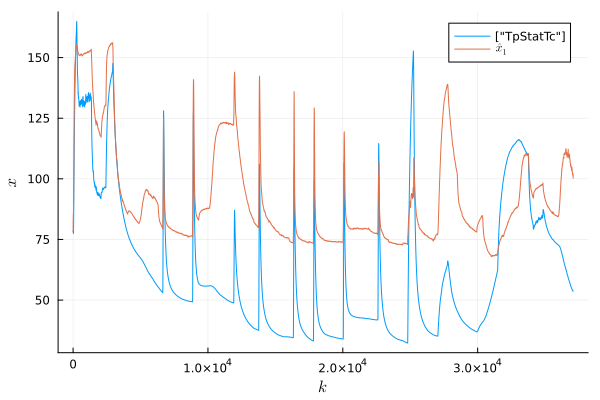

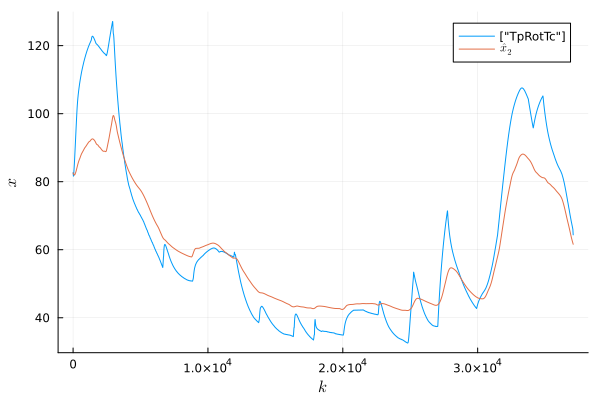

In [34]:
parameters_evaluation = deserialize("model_parameters_test1.jls");

measurement_series_idx = 5

_u = extract(U, measurement_series, measurement_series_idx);
_target = extract(X, measurement_series, measurement_series_idx);
_x0 = _target[1, :];

tsteps = collect(0:0.5:(size(_u, 1) * 0.5));

predicted_trajectory = ModelForwardPass.your_model_forward_pass(
    inputs=_u,
    x0=_x0,
    parameters=parameters_evaluation,
    tsteps=tsteps
);


println("MSE: ", StatsBase.mean((_target - predicted_trajectory).^2))

p_eval = plot(xlabel=L"k", ylabel=L"x")

p_eval = plot_at_idx(p_eval, X, measurement_series, XNames, measurement_series_idx=measurement_series_idx, feature_idx=1)
p_eval = plot!(p_eval, predicted_trajectory[:, 1], label=L"\hat{x}_1")

display(p_eval)

p_eval = plot(xlabel=L"k", ylabel=L"x")

p_eval = plot_at_idx(p_eval, X, measurement_series, XNames, measurement_series_idx=measurement_series_idx, feature_idx=2)
p_eval = plot!(p_eval, predicted_trajectory[:, 2], label=L"\hat{x}_2")

display(p_eval)

MSE: 626.1186270887356


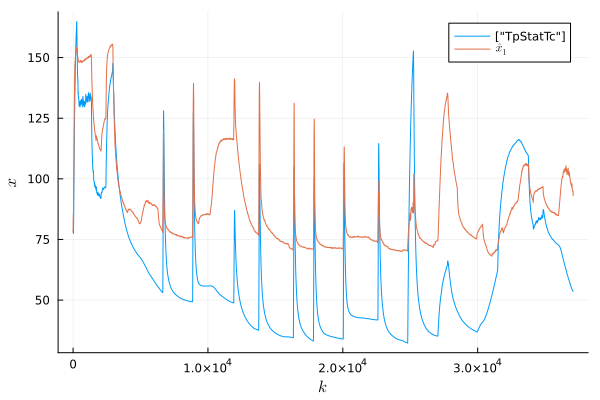

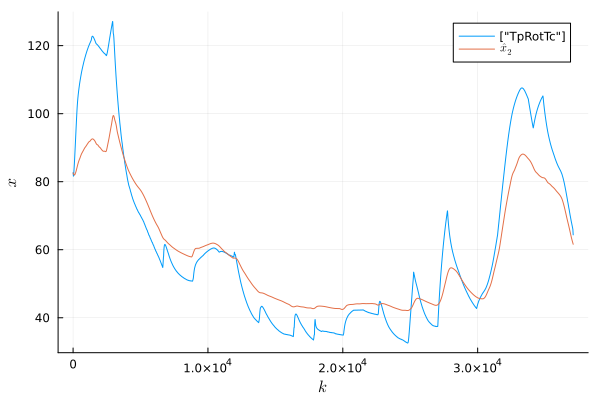

In [35]:
parameters_evaluation = deserialize("model_parameters_test2.jls");

measurement_series_idx = 5

_u = extract(U, measurement_series, measurement_series_idx);
_target = extract(X, measurement_series, measurement_series_idx);
_x0 = _target[1, :];

tsteps = collect(0:0.5:(size(_u, 1) * 0.5));

predicted_trajectory = ModelForwardPass.your_model_forward_pass(
    inputs=_u,
    x0=_x0,
    parameters=parameters_evaluation,
    tsteps=tsteps
);


println("MSE: ", StatsBase.mean((_target - predicted_trajectory).^2))

p_eval = plot(xlabel=L"k", ylabel=L"x")

p_eval = plot_at_idx(p_eval, X, measurement_series, XNames, measurement_series_idx=measurement_series_idx, feature_idx=1)
p_eval = plot!(p_eval, predicted_trajectory[:, 1], label=L"\hat{x}_1")

display(p_eval)

p_eval = plot(xlabel=L"k", ylabel=L"x")

p_eval = plot_at_idx(p_eval, X, measurement_series, XNames, measurement_series_idx=measurement_series_idx, feature_idx=2)
p_eval = plot!(p_eval, predicted_trajectory[:, 2], label=L"\hat{x}_2")

display(p_eval)

MSE: 510.333322411812


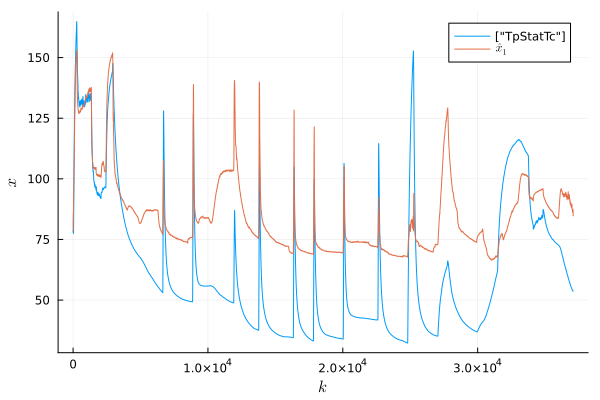

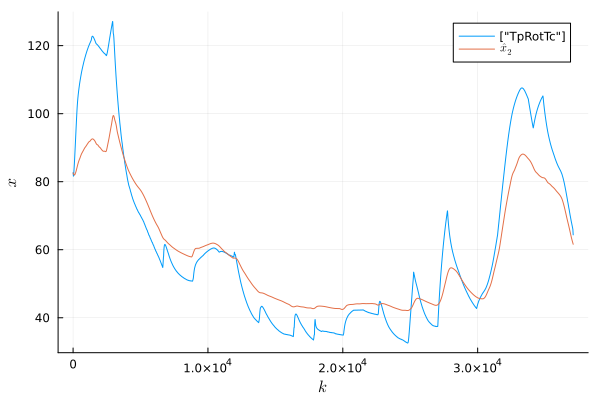

In [36]:
parameters_evaluation = deserialize("model_parameters_test3.jls");

measurement_series_idx = 5

_u = extract(U, measurement_series, measurement_series_idx);
_target = extract(X, measurement_series, measurement_series_idx);
_x0 = _target[1, :];

tsteps = collect(0:0.5:(size(_u, 1) * 0.5));

predicted_trajectory = ModelForwardPass.your_model_forward_pass(
    inputs=_u,
    x0=_x0,
    parameters=parameters_evaluation,
    tsteps=tsteps
);


println("MSE: ", StatsBase.mean((_target - predicted_trajectory).^2))

p_eval = plot(xlabel=L"k", ylabel=L"x")

p_eval = plot_at_idx(p_eval, X, measurement_series, XNames, measurement_series_idx=measurement_series_idx, feature_idx=1)
p_eval = plot!(p_eval, predicted_trajectory[:, 1], label=L"\hat{x}_1")

display(p_eval)

p_eval = plot(xlabel=L"k", ylabel=L"x")

p_eval = plot_at_idx(p_eval, X, measurement_series, XNames, measurement_series_idx=measurement_series_idx, feature_idx=2)
p_eval = plot!(p_eval, predicted_trajectory[:, 2], label=L"\hat{x}_2")

display(p_eval)

MSE: 430.2930344127911


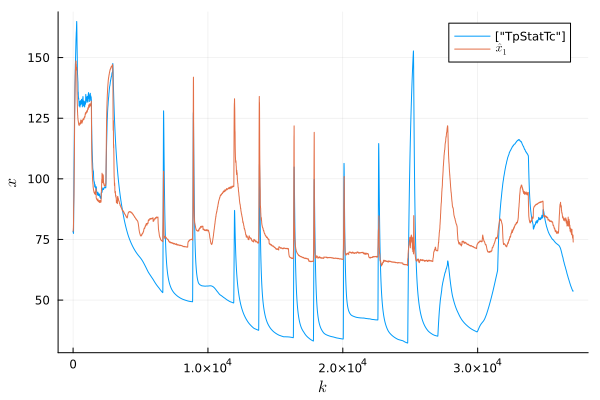

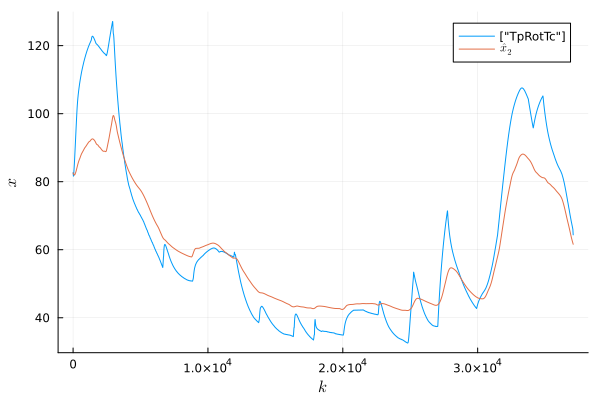

In [37]:
parameters_evaluation = deserialize("model_parameters_test4.jls");

measurement_series_idx = 5

_u = extract(U, measurement_series, measurement_series_idx);
_target = extract(X, measurement_series, measurement_series_idx);
_x0 = _target[1, :];

tsteps = collect(0:0.5:(size(_u, 1) * 0.5));

predicted_trajectory = ModelForwardPass.your_model_forward_pass(
    inputs=_u,
    x0=_x0,
    parameters=parameters_evaluation,
    tsteps=tsteps
);


println("MSE: ", StatsBase.mean((_target - predicted_trajectory).^2))

p_eval = plot(xlabel=L"k", ylabel=L"x")

p_eval = plot_at_idx(p_eval, X, measurement_series, XNames, measurement_series_idx=measurement_series_idx, feature_idx=1)
p_eval = plot!(p_eval, predicted_trajectory[:, 1], label=L"\hat{x}_1")

display(p_eval)

p_eval = plot(xlabel=L"k", ylabel=L"x")

p_eval = plot_at_idx(p_eval, X, measurement_series, XNames, measurement_series_idx=measurement_series_idx, feature_idx=2)
p_eval = plot!(p_eval, predicted_trajectory[:, 2], label=L"\hat{x}_2")

display(p_eval)